In [1]:
!pip install evaluate --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 43.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
pylibcudf-cu12 25.2.2 requires pyarrow<20.0.0a0,>=14.0.0; platform_machine == "x86_64", but you have pyarrow 21.0.0 which is incompatible.
cudf-cu12 25.2.2 requires pyarrow<20.0.0a0,>=14.0.0; platform_machine == "x86_64", but you have pyarrow 21.0.0 which is incompatible.
bigframes 2.12.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.31.0, but you have google-cloud-bigquery 3.25.0 which is incompatible.
bigframes 2.12.0 requires rich<14,>=12.4.4, but you have rich 14.1.0 which is incompatible.
cudf-polars-cu12 25.6.0 requires pylibcudf-cu12==25.6.*, but you ha

In [2]:
import glob
import os

import evaluate
import kagglehub
import matplotlib.pyplot as plt
import random
import numpy as np
from PIL import Image
from tqdm import tqdm

import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import LambdaLR

from datasets import Dataset, DatasetDict
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

2025-10-12 17:49:03.823674: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760291344.037836      18 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760291344.100462      18 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
pipeline_testing = False
subset_ratio = 1
epochs = 30
batch_size = 16
vis_freq = 10
init_evals = True

In [4]:
if pipeline_testing:
    subset_ratio = 0.1
    epochs = 4
    vis_freq = 2

random_imgs = []
if subset_ratio == 1:
    random_imgs = [26, 662, 834, 442, 1493, 468, 843, 368, 174]
elif subset_ratio >= 0.1:
    random_imgs = [3, 12, 16, 24, 26]
else:
    raise Exception(f"Unsupported subset_ratio: {subset_ratio}")

In [5]:
seed = 42

random.seed(seed)
np.random.seed(seed)

torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

g = torch.Generator()
g.manual_seed(seed)

In [6]:
model_id = "nvidia/segformer-b0-finetuned-ade-512-512"
model = SegformerForSemanticSegmentation.from_pretrained(model_id)
processor = SegformerImageProcessor.from_pretrained(model_id)

metric = evaluate.load("mean_iou", keep_in_memory=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(device)

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:172: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


cuda


In [7]:
ade20k_path = kagglehub.dataset_download("awsaf49/ade20k-dataset")
ade20k_path = os.path.join(ade20k_path, "ADEChallengeData2016")

train_images = sorted(glob.glob(os.path.join(ade20k_path, "images", "training", "*.jpg")))
train_masks  = sorted(glob.glob(os.path.join(ade20k_path, "annotations", "training", "*.png")))

val_images = sorted(glob.glob(os.path.join(ade20k_path, "images", "validation", "*.jpg")))
val_masks  = sorted(glob.glob(os.path.join(ade20k_path, "annotations", "validation", "*.png")))

n_train = int(len(train_images) * subset_ratio)
n_val   = int(len(val_images) * subset_ratio)

class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, mask_paths, processor):
        assert len(image_paths) == len(mask_paths), "Mismatch between images and masks"
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.processor = processor

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        if isinstance(idx, list):
            return [self.__getitem__(i) for i in idx]

        img = Image.open(self.image_paths[idx]).convert("RGB")
        mask = Image.open(self.mask_paths[idx])

        encoding = self.processor(
            images=img,
            segmentation_maps=mask,
            return_tensors="pt"
        )

        pixel_values = encoding["pixel_values"].squeeze(0)
        labels = encoding["labels"].squeeze(0)

        return {"pixel_values": pixel_values, "labels": labels}

train_dataset_small = SegmentationDataset(train_images[:n_train], train_masks[:n_train], processor)
val_dataset_small   = SegmentationDataset(val_images[:n_val], val_masks[:n_val], processor)

train_loader = DataLoader(
    train_dataset_small,
    batch_size=batch_size,
    shuffle=True,
    generator=g,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset_small,
    batch_size=batch_size,
    shuffle=False,
    generator=g,
    num_workers=4,
    pin_memory=True
)

In [8]:
def evaluate_iou_hf(model, dataloader, num_classes=150, ignore_index=255, device="cuda"):
    model.eval()
    metric = evaluate.load("mean_iou", keep_in_memory=True)

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating IoU"):
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            outputs = model(pixel_values=pixel_values)
            logits = outputs.logits
            preds = torch.argmax(logits, dim=1)

            if preds.shape[-2:] != labels.shape[-2:]:
                preds = F.interpolate(
                    preds.unsqueeze(1).float(),
                    size=labels.shape[-2:],
                    mode="nearest"
                ).squeeze(1).long()

            metric.add_batch(
                predictions=preds.cpu().numpy(),
                references=labels.cpu().numpy()
            )

    result = metric.compute(
        num_labels=num_classes,
        ignore_index=ignore_index,
        reduce_labels=False
    )
    return result

In [9]:
init_result = 0
if init_evals:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    result = evaluate_iou_hf(
        model, val_loader, num_classes=150, ignore_index=255, device=device)
    print(f"Validation Mean IoU: {result['mean_iou']:.4f}")
    init_result = result['mean_iou']
else:
    print("Skipping initial evaluation...")

Evaluating IoU:   0%|          | 0/125 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/datasets/features/image.py:361: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
Evaluating IoU: 100%|██████████| 125/125 [00:49<00:00,  2.53it/s]


Validation Mean IoU: 0.3604


In [10]:
def visualize_and_iou(model, dataset, sample_indices, processor, device, epoch=None, num_classes=150, ignore_index=255):
    model.eval()
    results_local = {}
    with torch.no_grad():
        for img in sample_indices:
            sample = dataset[img]
            pixel_values = sample["pixel_values"].unsqueeze(0).to(device)
            labels = sample["labels"].unsqueeze(0).to(device)

            outputs = model(pixel_values=pixel_values)
            logits = outputs.logits
            predicted = torch.argmax(logits, dim=1)

            pred_mask = predicted.squeeze().cpu().numpy()
            true_mask = labels.squeeze().cpu().numpy()

            image_np = pixel_values.squeeze().permute(1, 2, 0).cpu().numpy()
            image_np = (image_np * processor.image_std + processor.image_mean).clip(0, 1)

            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(image_np)
            axes[0].set_title("Input Image")
            axes[0].axis("off")

            axes[1].imshow(true_mask, cmap="tab20")
            axes[1].set_title("Ground Truth Mask")
            axes[1].axis("off")

            axes[2].imshow(pred_mask, cmap="tab20")
            axes[2].set_title("Predicted Mask")
            axes[2].axis("off")

            plt.show()

            img_dir = f"output/{img}"
            os.makedirs(img_dir, exist_ok=True)

            Image.fromarray((image_np * 255).astype("uint8")).save(f"{img_dir}/image.png")

            if epoch is None:
                pred_name = "base.png"
            else:
                pred_name = f"epoch_{epoch+1}.png"
            Image.fromarray(pred_mask.astype("uint8")).save(f"{img_dir}/{pred_name}")

            if true_mask.shape != pred_mask.shape:
                true_mask_resized = np.array(
                    Image.fromarray(true_mask.astype(np.uint8)).resize(
                        (pred_mask.shape[1], pred_mask.shape[0]),
                        resample=Image.NEAREST
                    )
                )
            else:
                true_mask_resized = true_mask
            Image.fromarray(true_mask_resized.astype("uint8")).save(f"{img_dir}/mask.png")

            results_metric = metric.compute(
                predictions=[pred_mask],
                references=[true_mask_resized],
                num_labels=num_classes,
                ignore_index=ignore_index,
                reduce_labels=False
            )

            mean_iou = results_metric["mean_iou"]
            print(f"{'[Epoch ' + str(epoch+1) + '] ' if epoch is not None else ''}Mean IoU: {mean_iou:.4f}")
            results_local[img] = mean_iou
    return results_local

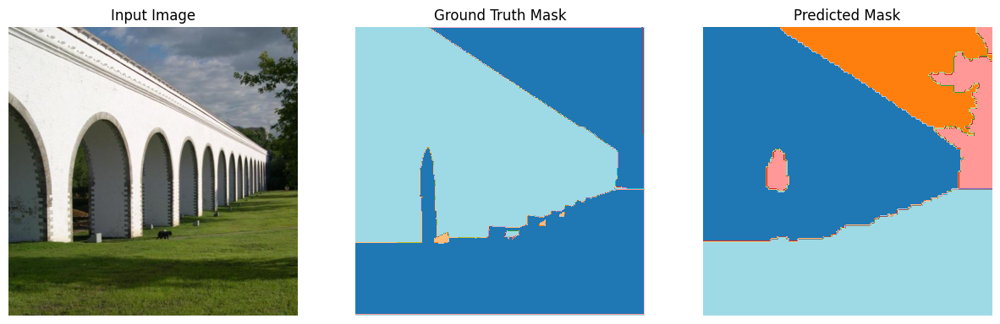

/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Mean IoU: 0.5482


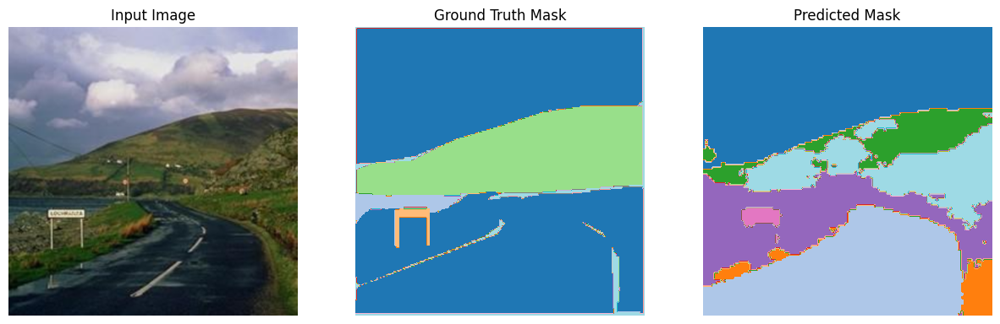

Mean IoU: 0.2984


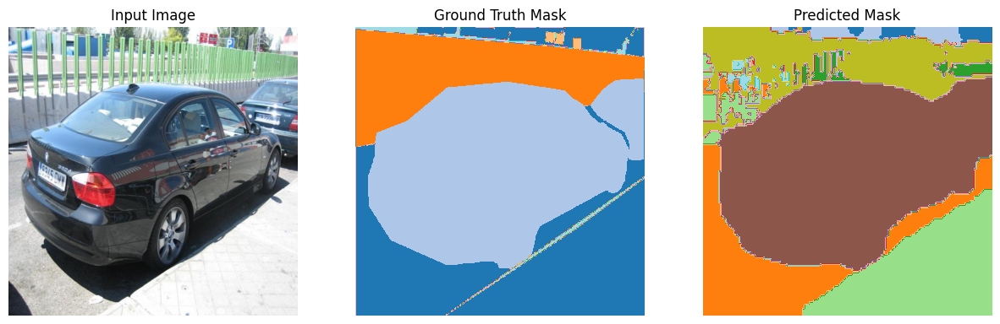

Mean IoU: 0.4152


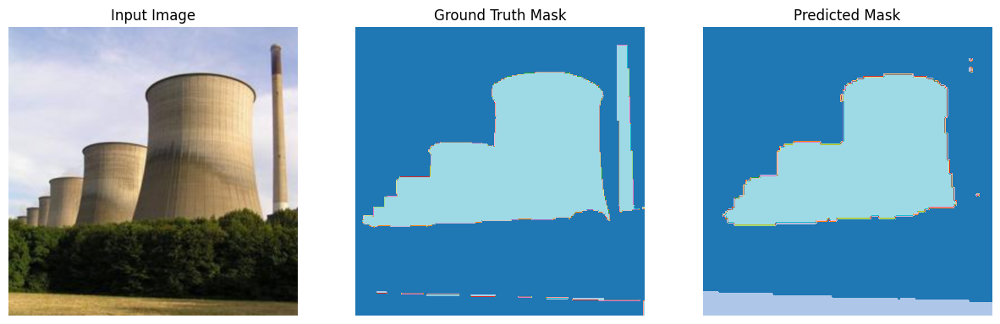

Mean IoU: 0.3639


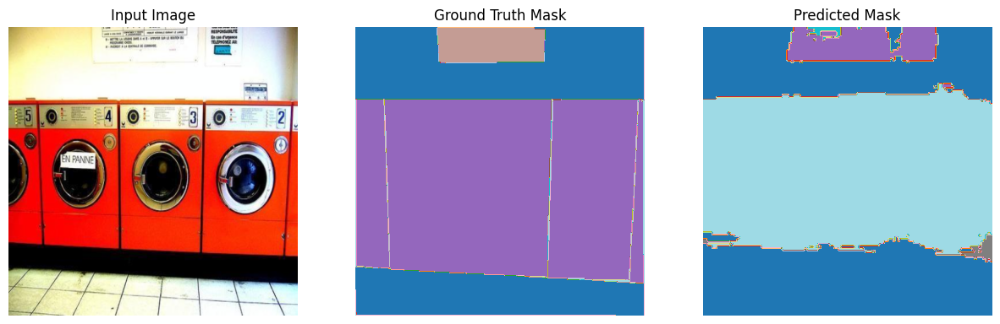

Mean IoU: 0.3200


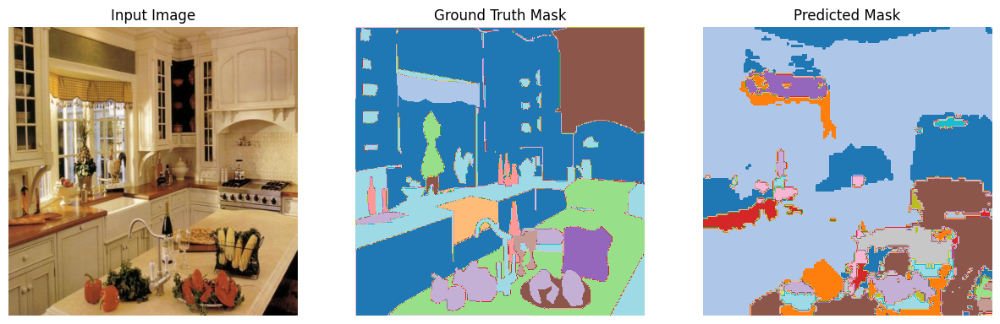

Mean IoU: 0.2104


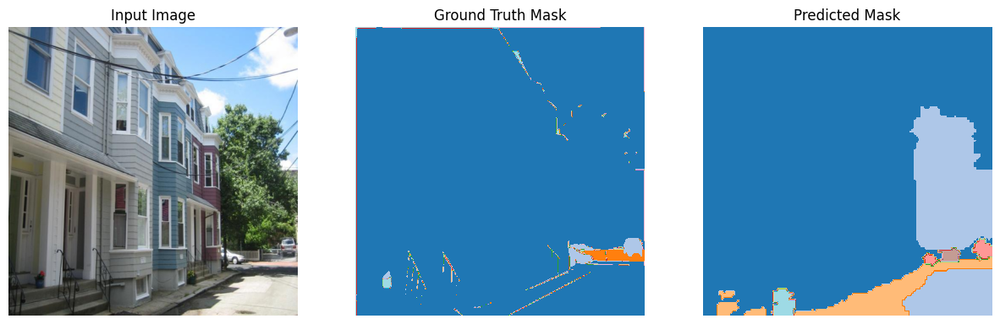

Mean IoU: 0.3871


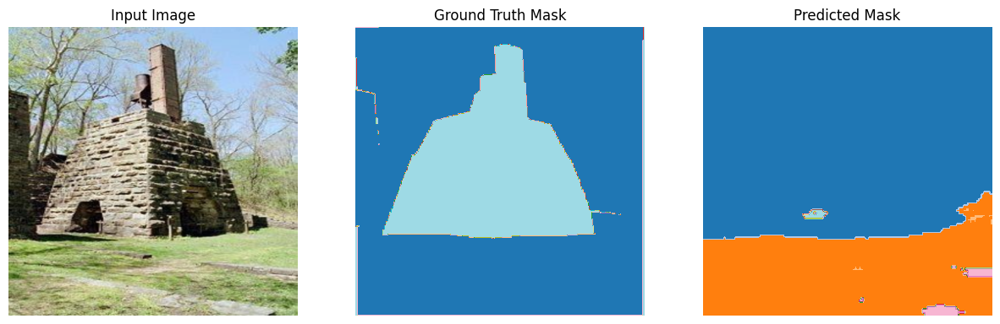

Mean IoU: 0.4481


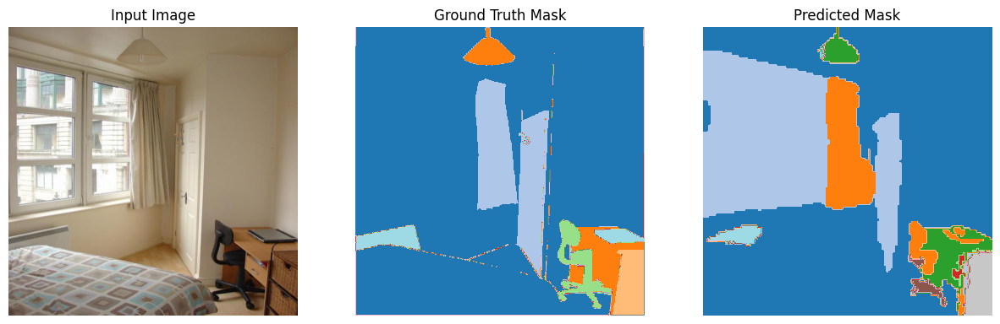

Mean IoU: 0.4020


In [11]:
results = {}
results[0] = [init_result]

pre_iou = visualize_and_iou(model, val_dataset_small, random_imgs, processor, device)
for img, iou in pre_iou.items():
    results[img] = [iou]

Trainable: decode_head.linear_fuse.weight
Trainable: decode_head.batch_norm.weight
Trainable: decode_head.batch_norm.bias
Trainable: decode_head.classifier.weight
Trainable: decode_head.classifier.bias
Trainable: decode_head.extra_conv.weight
Trainable: decode_head.extra_bn.weight
Trainable: decode_head.extra_bn.bias
Using device: cuda

Starting training...



Evaluating IoU: 100%|██████████| 125/125 [00:38<00:00,  3.29it/s]


[Epoch 1] Validation Mean IoU: 0.3218


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.12it/s]


[Epoch 2] Validation Mean IoU: 0.3310


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 3] Validation Mean IoU: 0.3314


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.16it/s]


[Epoch 4] Validation Mean IoU: 0.3363


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 5] Validation Mean IoU: 0.3418


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.14it/s]


[Epoch 6] Validation Mean IoU: 0.3426


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.15it/s]


[Epoch 7] Validation Mean IoU: 0.3394


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.14it/s]


[Epoch 8] Validation Mean IoU: 0.3431


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 9] Validation Mean IoU: 0.3421


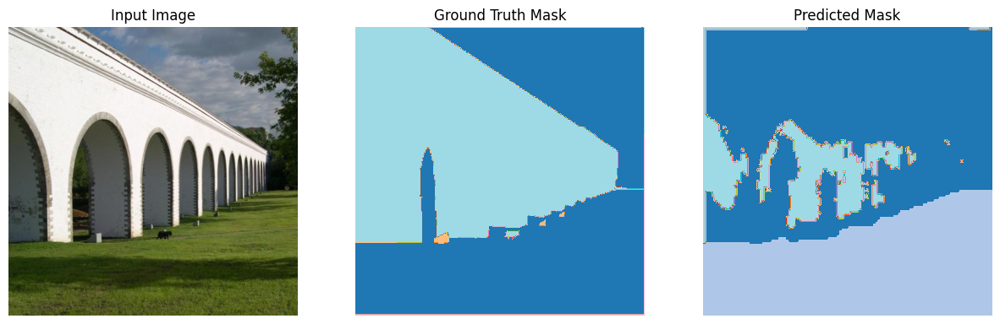

[Epoch 10] Mean IoU: 0.4549


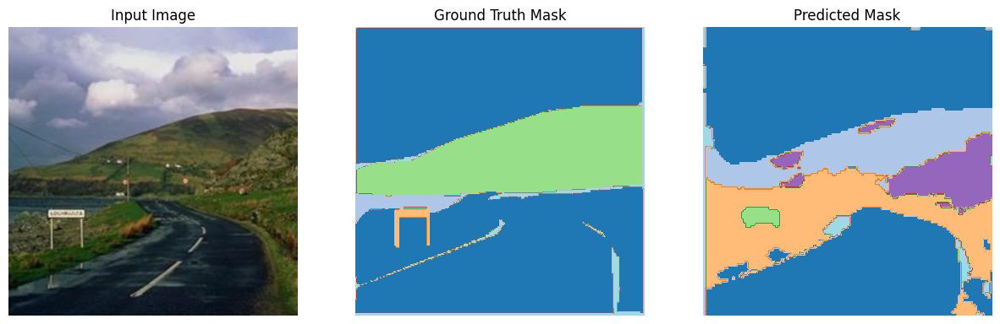

[Epoch 10] Mean IoU: 0.2611


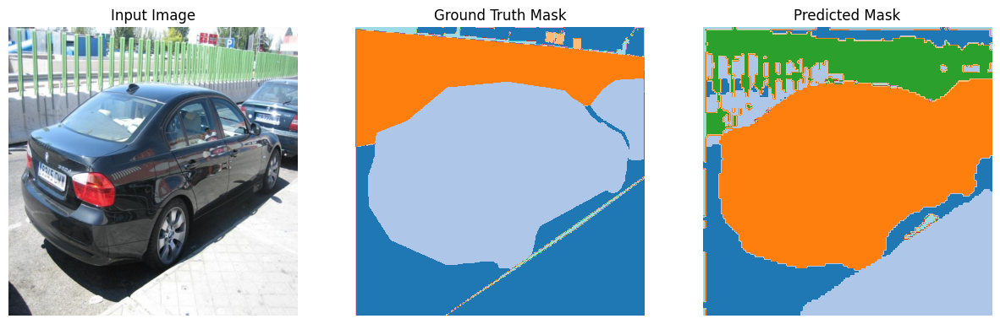

[Epoch 10] Mean IoU: 0.3972


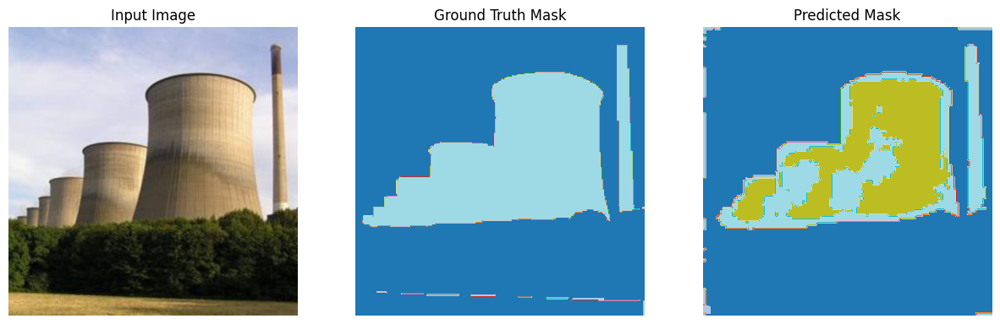

[Epoch 10] Mean IoU: 0.3855


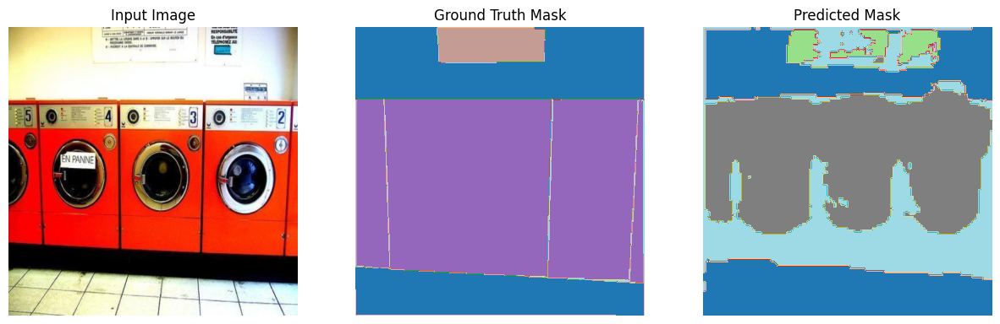

[Epoch 10] Mean IoU: 0.3765


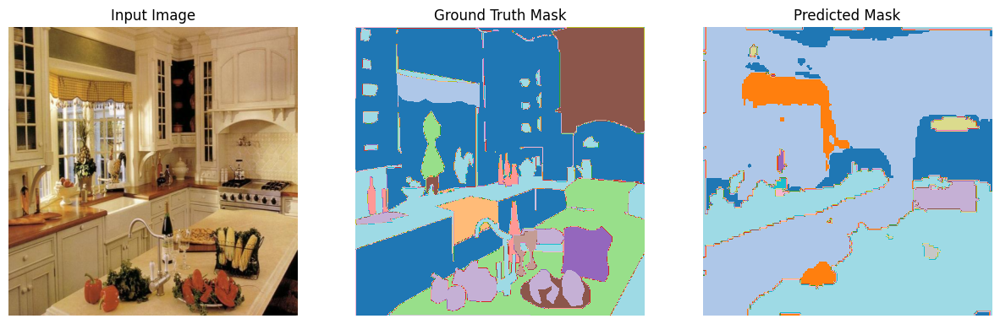

[Epoch 10] Mean IoU: 0.2301


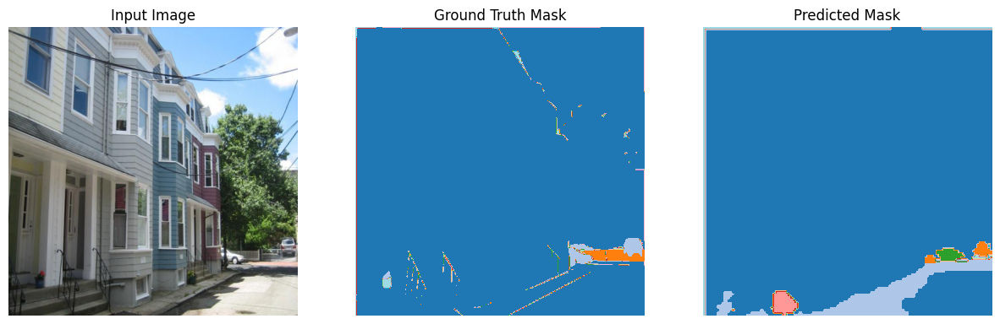

[Epoch 10] Mean IoU: 0.3479


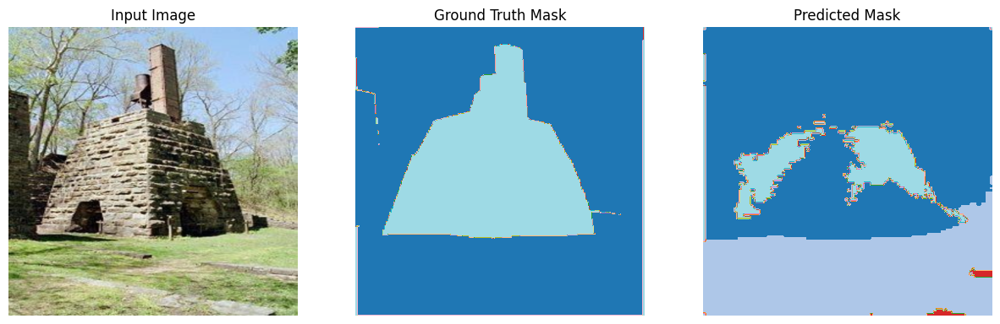

[Epoch 10] Mean IoU: 0.3249


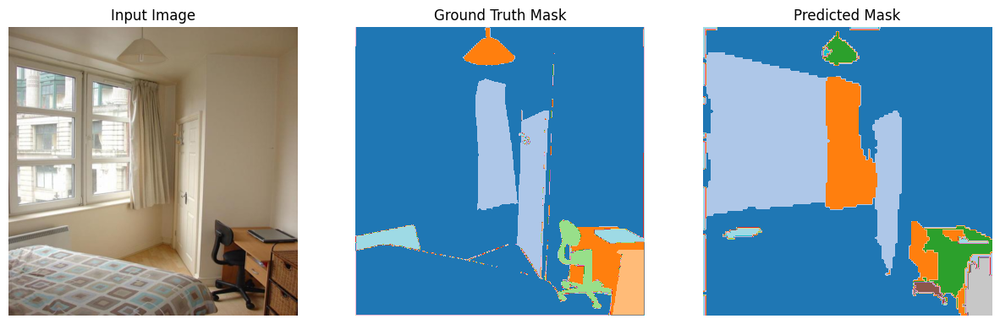

[Epoch 10] Mean IoU: 0.4146


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.12it/s]


[Epoch 10] Validation Mean IoU: 0.3426


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.06it/s]


[Epoch 11] Validation Mean IoU: 0.3434


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.11it/s]


[Epoch 12] Validation Mean IoU: 0.3426


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.11it/s]


[Epoch 13] Validation Mean IoU: 0.3449


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.11it/s]


[Epoch 14] Validation Mean IoU: 0.3392


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.07it/s]


[Epoch 15] Validation Mean IoU: 0.3460


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.12it/s]


[Epoch 16] Validation Mean IoU: 0.3468


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.15it/s]


[Epoch 17] Validation Mean IoU: 0.3469


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.11it/s]


[Epoch 18] Validation Mean IoU: 0.3465


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.09it/s]


[Epoch 19] Validation Mean IoU: 0.3435


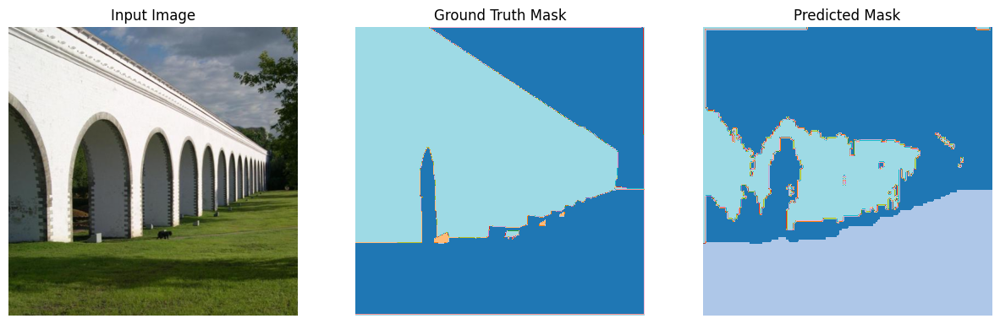

[Epoch 20] Mean IoU: 0.4550


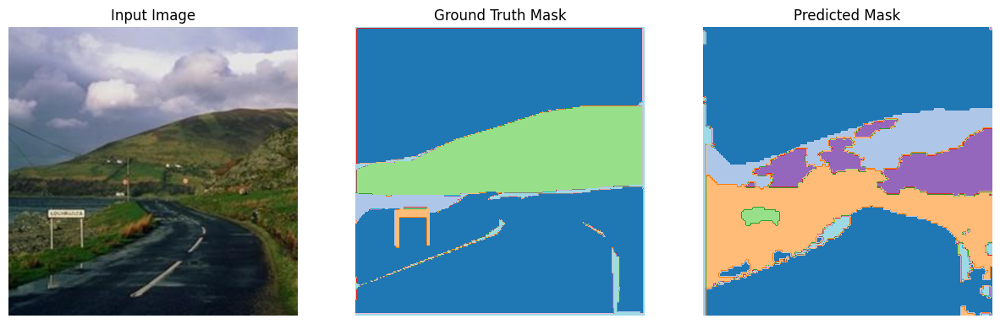

[Epoch 20] Mean IoU: 0.3061


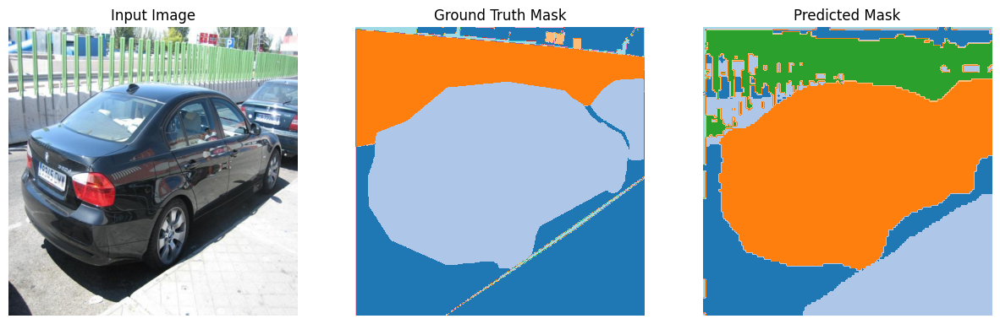

[Epoch 20] Mean IoU: 0.3591


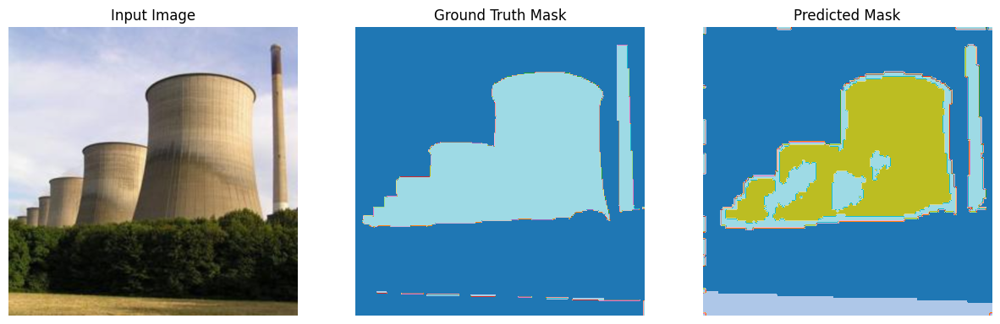

[Epoch 20] Mean IoU: 0.3859


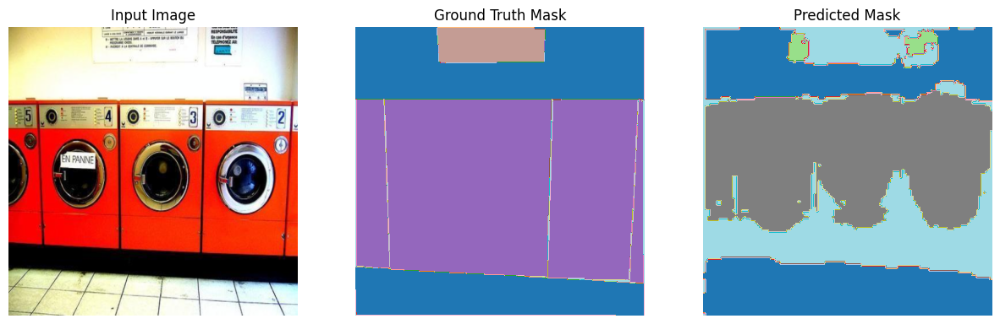

[Epoch 20] Mean IoU: 0.3732


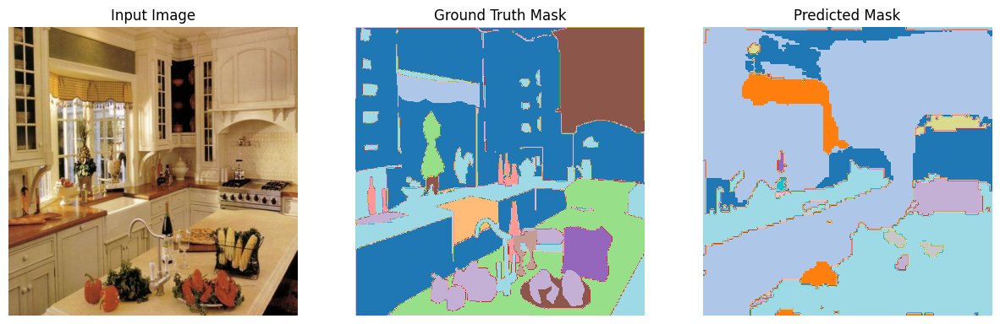

[Epoch 20] Mean IoU: 0.2283


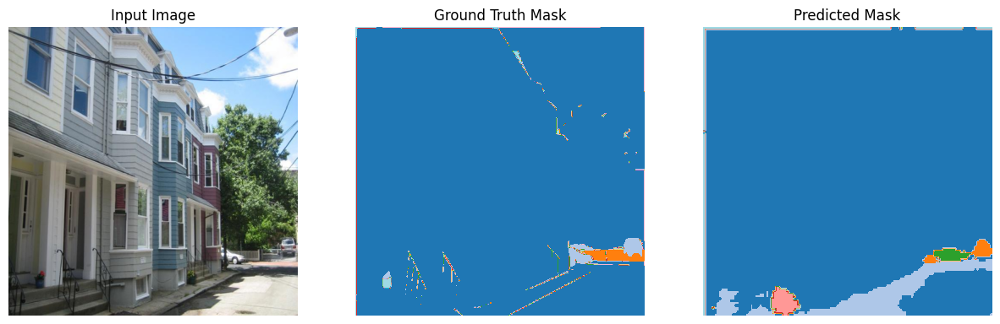

[Epoch 20] Mean IoU: 0.3645


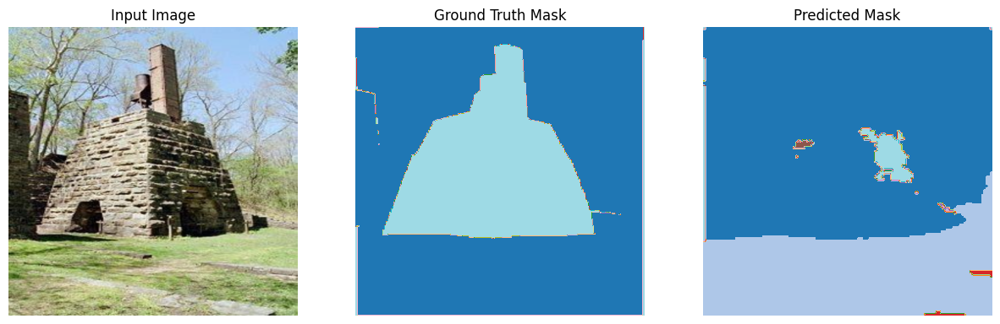

[Epoch 20] Mean IoU: 0.3311


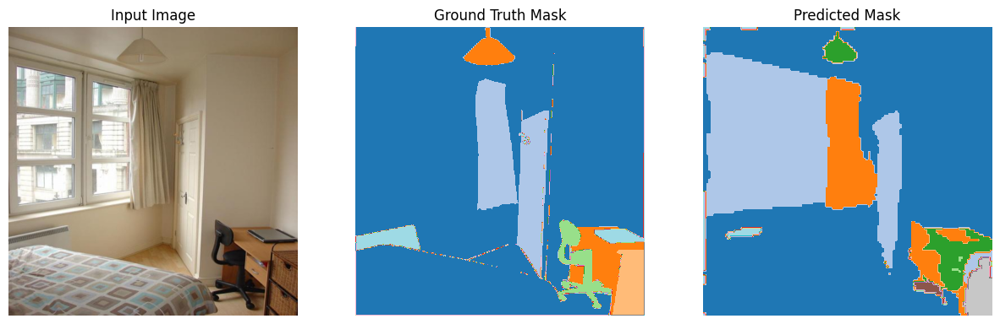

[Epoch 20] Mean IoU: 0.4116


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.15it/s]


[Epoch 20] Validation Mean IoU: 0.3455


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.14it/s]


[Epoch 21] Validation Mean IoU: 0.3455


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.12it/s]


[Epoch 22] Validation Mean IoU: 0.3462


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 23] Validation Mean IoU: 0.3482


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.14it/s]


[Epoch 24] Validation Mean IoU: 0.3457


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 25] Validation Mean IoU: 0.3466


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.16it/s]


[Epoch 26] Validation Mean IoU: 0.3473


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 27] Validation Mean IoU: 0.3462


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.11it/s]


[Epoch 28] Validation Mean IoU: 0.3461


Evaluating IoU: 100%|██████████| 125/125 [00:40<00:00,  3.12it/s]


[Epoch 29] Validation Mean IoU: 0.3457


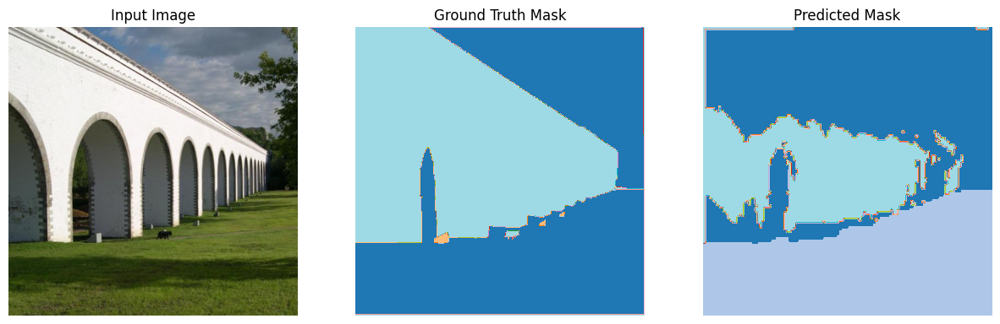

[Epoch 30] Mean IoU: 0.4582


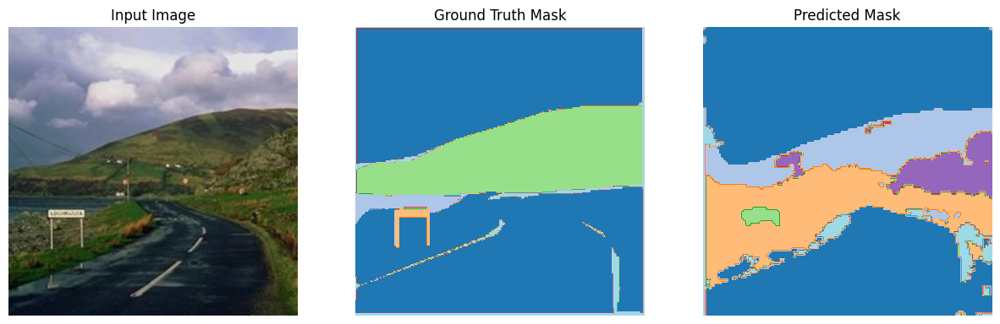

[Epoch 30] Mean IoU: 0.2393


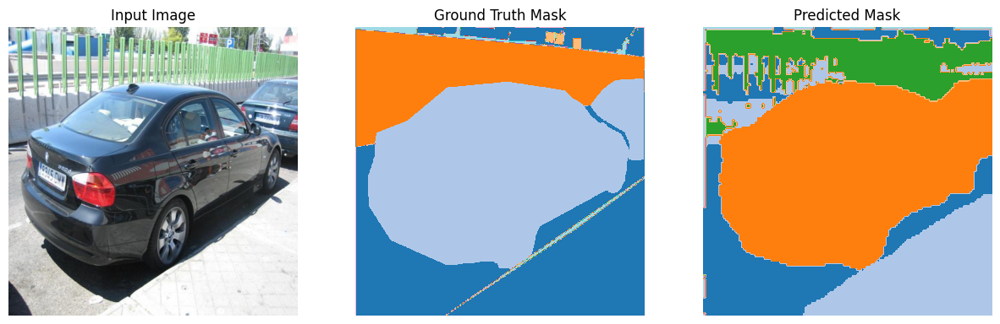

[Epoch 30] Mean IoU: 0.3481


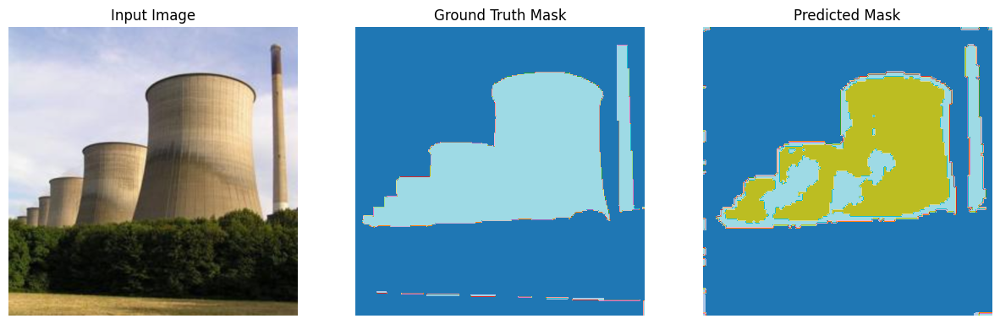

[Epoch 30] Mean IoU: 0.3895


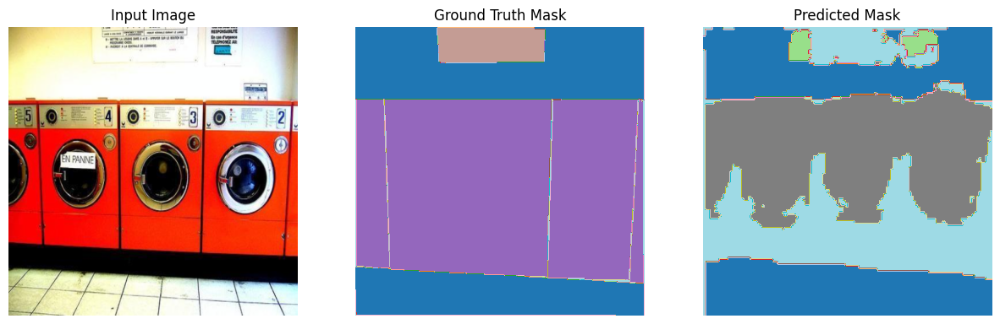

[Epoch 30] Mean IoU: 0.3700


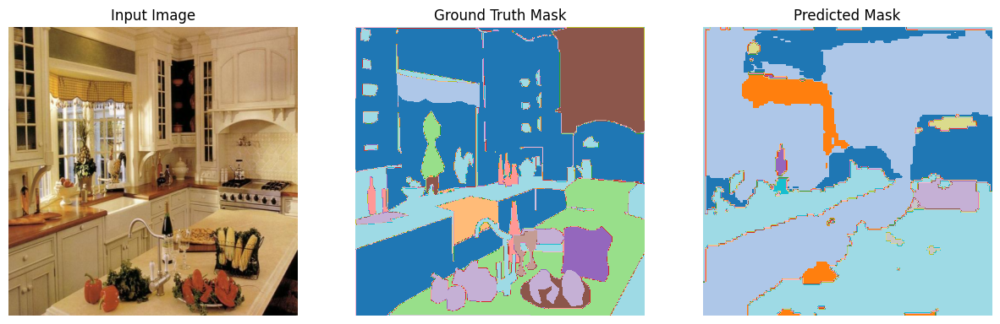

[Epoch 30] Mean IoU: 0.2416


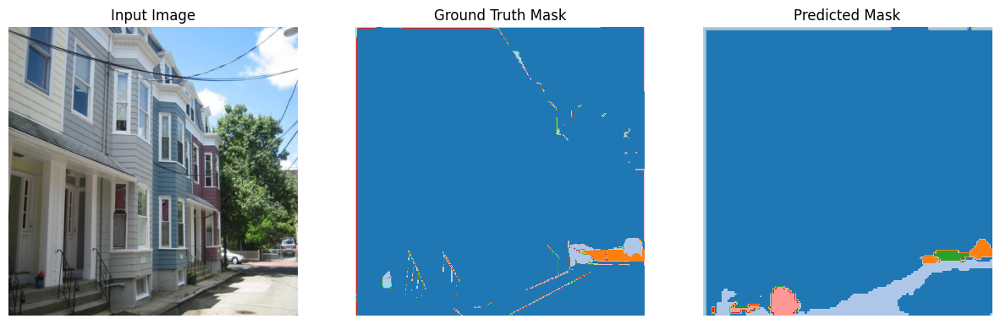

[Epoch 30] Mean IoU: 0.3697


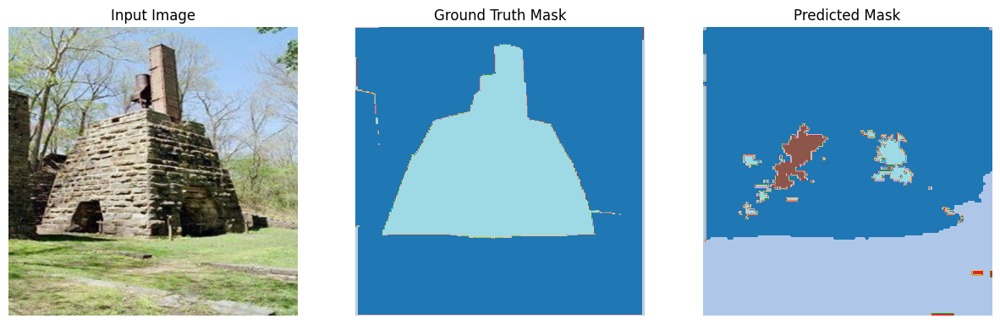

[Epoch 30] Mean IoU: 0.3358


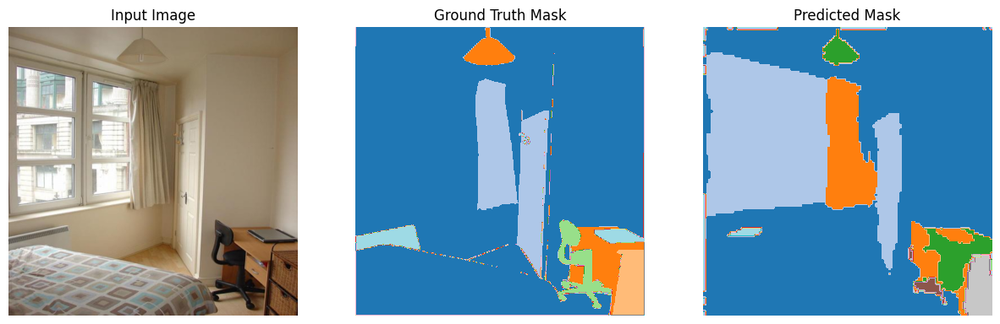

[Epoch 30] Mean IoU: 0.4189


Evaluating IoU: 100%|██████████| 125/125 [00:39<00:00,  3.13it/s]


[Epoch 30] Validation Mean IoU: 0.3459


In [12]:
model_id = "nvidia/segformer-b0-finetuned-ade-512-512"
model = SegformerForSemanticSegmentation.from_pretrained(model_id)
processor = SegformerImageProcessor.from_pretrained(model_id)

metric = evaluate.load("mean_iou", keep_in_memory=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

class CustomSegformerDecodeHead(nn.Module):
    def __init__(self, original_head):
        super().__init__()
        self.linear_c = nn.ModuleList(original_head.linear_c)
        self.linear_fuse = original_head.linear_fuse
        self.batch_norm = original_head.batch_norm
        self.activation = original_head.activation
        self.dropout = original_head.dropout
        self.classifier = original_head.classifier

        self.extra_conv = nn.Conv2d(
            in_channels=256,
            out_channels=256,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=False
        )
        self.extra_bn = nn.BatchNorm2d(256)
        self.extra_act = nn.ReLU(inplace=True)

    def forward(self, inputs):
        mlp_outputs = []
        target_size = inputs[0].shape[-2:]
        for i, (x, mlp) in enumerate(zip(inputs, self.linear_c)):
            x = mlp(x)
            bs, L, C = x.shape
            H, W = inputs[i].shape[2], inputs[i].shape[3]
            x = x.transpose(1, 2).reshape(bs, C, H, W)

            if x.shape[2:] != target_size:
                x = F.interpolate(x, size=target_size, mode="bilinear", align_corners=False)
            
            mlp_outputs.append(x)

        x = torch.cat(mlp_outputs[::-1], dim=1)

        x = self.linear_fuse(x)
        x = self.batch_norm(x)
        x = self.activation(x)

        x = self.extra_conv(x)
        x = self.extra_bn(x)
        x = self.extra_act(x)
        
        x = self.dropout(x)
        x = self.classifier(x)
        return x
    
model.decode_head = CustomSegformerDecodeHead(model.decode_head)

for name, param in model.named_parameters():
    param.requires_grad = False

unfreeze_layers = [
    "decode_head.linear_fuse",
    "decode_head.batch_norm",
    "decode_head.activation",
    "decode_head.extra_conv",
    "decode_head.extra_bn",
    "decode_head.extra_act",
    "decode_head.dropout",
    "decode_head.classifier"
]

for n, p in model.named_parameters():
    if any(n.startswith(layer) for layer in unfreeze_layers):
        p.requires_grad = True

for name, param in model.named_parameters():
    if param.requires_grad:
        print(f"Trainable: {name}")

optimizer = optim.AdamW(model.parameters(), lr=0.00006, weight_decay=0.01)
power = 1.0

def poly_lr_lambda(epoch):
    return (1 - epoch / epochs) ** power

scheduler = LambdaLR(optimizer, lr_lambda=poly_lr_lambda)

criterion = nn.CrossEntropyLoss(ignore_index=150)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model.to(device)

print("\nStarting training...\n")

model.train()
for epoch in range(epochs):
    for batch_idx, batch in enumerate(train_loader):
        inputs, labels = batch["pixel_values"].to(device), batch["labels"].to(device)

        optimizer.zero_grad()

        outputs = model(pixel_values=inputs).logits

        labels_resized = F.interpolate(
            labels.unsqueeze(1).float(),
            size=outputs.shape[2:],
            mode="nearest"
        ).squeeze(1).long()
        labels_resized = torch.clamp(labels_resized, max=149)

        loss = criterion(outputs, labels_resized)
        loss.backward()
        optimizer.step()

    scheduler.step()
    model.eval()

    if (epoch + 1) % vis_freq == 0:
        epoch_iou_results = visualize_and_iou(model, val_dataset_small, random_imgs, processor, device, epoch)
        for img, iou in epoch_iou_results.items():
            results[img].append(iou)

    total_iou = 0.0
    num_samples = 0
    
    result = evaluate_iou_hf(model, val_loader, num_classes=150, ignore_index=255, device=device)
    epoch_iou = result["mean_iou"]
    print(f"[Epoch {epoch+1}] Validation Mean IoU: {epoch_iou:.4f}")
    results[0].append(epoch_iou)

    model.train()

In [13]:
print(results)

{0: [0.3604240801281272, 0.3217923012128612, 0.3310484852556281, 0.3313655394843759, 0.33625970555453527, 0.3418024736264283, 0.3425702262127, 0.33935037718493705, 0.3431251316220821, 0.34214500521263586, 0.34263259642395993, 0.3434035855952909, 0.3426229965100393, 0.344943919221805, 0.3391796163858232, 0.3459536019028279, 0.3468017966629816, 0.3469090802214377, 0.3464969329219285, 0.3435171102149737, 0.34546550461807235, 0.34554547533458096, 0.34622842914634605, 0.34823859194060836, 0.3457384184893643, 0.34663434717478264, 0.3473338135550032, 0.34619094470401524, 0.34606824797759106, 0.34569692765270604, 0.3458870708127637], 26: [0.5481663002004298, 0.4549280840551526, 0.45496093354148465, 0.45820341734692166], 662: [0.29843258252651095, 0.261105547687167, 0.30613955402303805, 0.23925751089900266], 834: [0.41524445935129084, 0.39722690500722607, 0.359132702463404, 0.34814415727010606], 442: [0.36385544740419107, 0.38553491998318323, 0.38591875948446586, 0.38947533385090594], 1493: [0.

In [14]:
for img_idx, iou_values in results.items():
    if not isinstance(iou_values, list):
        iou_values = [iou_values]
    
    formatted_values = ", ".join(f"{v:.4f}" for v in iou_values)
    print(f"Image {img_idx}: {formatted_values}")

Image 0: 0.3604, 0.3218, 0.3310, 0.3314, 0.3363, 0.3418, 0.3426, 0.3394, 0.3431, 0.3421, 0.3426, 0.3434, 0.3426, 0.3449, 0.3392, 0.3460, 0.3468, 0.3469, 0.3465, 0.3435, 0.3455, 0.3455, 0.3462, 0.3482, 0.3457, 0.3466, 0.3473, 0.3462, 0.3461, 0.3457, 0.3459
Image 26: 0.5482, 0.4549, 0.4550, 0.4582
Image 662: 0.2984, 0.2611, 0.3061, 0.2393
Image 834: 0.4152, 0.3972, 0.3591, 0.3481
Image 442: 0.3639, 0.3855, 0.3859, 0.3895
Image 1493: 0.3200, 0.3765, 0.3732, 0.3700
Image 468: 0.2104, 0.2301, 0.2283, 0.2416
Image 843: 0.3871, 0.3479, 0.3645, 0.3697
Image 368: 0.4481, 0.3249, 0.3311, 0.3358
Image 174: 0.4020, 0.4146, 0.4116, 0.4189


In [15]:
import json
import zipfile

with open("output/results.json", "w") as f:
    json.dump(results, f, indent=4)

print("Results successfully saved to results.json")

output_dir = "output"
zip_path = "output.zip"

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(output_dir):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, start=output_dir)
            zipf.write(file_path, arcname=os.path.join(os.path.basename(output_dir), arcname))

print(f"Directory '{output_dir}' successfully zipped to {zip_path}")

Results successfully saved to results.json
Directory 'output' successfully zipped to output.zip
